In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from PIL import Image
from skimage import transform
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
import itertools
import cv2

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']

caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']

  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']

caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10t

In [2]:
train_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/train/'
valid_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/val/'
test_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/test/'

In [3]:
photo_size=299

In [4]:
def prepare_dataset(data_dir):
    datagen = ImageDataGenerator(
        rescale= 1./255,
        rotation_range=40,
        width_shift_range=.2,
        height_shift_range=.2,
        shear_range=.1,
        zoom_range=.2,
        horizontal_flip=True,
        fill_mode='nearest',
    )
    generator = datagen.flow_from_directory(
        data_dir,
        shuffle=True,
        color_mode = "rgb",
        target_size=(photo_size,photo_size),
        class_mode='binary',
        batch_size=128,
        classes=['NORMAL','PNEUMONIA']
    )
    return generator

In [5]:
train_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/train/')
validation_generator = prepare_dataset('../input/chest-xray-pneumonia/chest_xray/val/')
test_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/test/')

Found 5216 images belonging to 2 classes.

Found 16 images belonging to 2 classes.

Found 624 images belonging to 2 classes.


In [6]:
validation_generator.class_indices

{'NORMAL': 0, 'PNEUMONIA': 1}

In [7]:
def show_few_images(number_of_examples=6, models=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(test_folders)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(test_folders)):
        
        image_ids = os.listdir(os.path.join(test_folders,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            path = os.path.join(test_folders,folder,image_ids[j])
            
            display = plt.imread(path)
            plt.axis('off')
            figure1.tight_layout()
            ax1[axs].imshow(display)
            title = 'True: '+folder

            if(models):
                for model in models:
                    if (model==vgg):
                        img = cv2.resize(cv2.imread(path),(299,299))
                        img_normalized = img/255
                        image_vgg_prediction = vgg.predict(np.array([img_normalized])).argmax()
                        if (image_vgg_prediction==1):
                            title = title+"\nvgg Prediction: PNEUMONIA"
                        else:
                            title = title+"\nvgg Prediction: NORMAL"
            ax1[axs].set_title(title)
            axs=axs+1

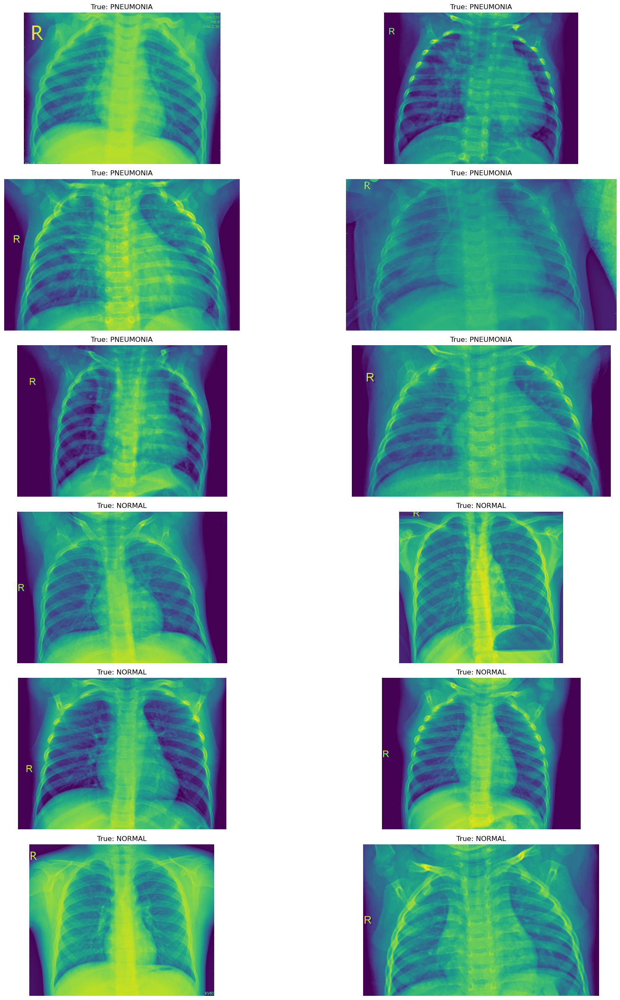

In [8]:
show_few_images()

In [9]:
epochs = 100

In [10]:
vgg = VGG16(weights='imagenet', include_top=False, input_shape=(photo_size, photo_size, 3))
for layer in vgg.layers:
    layer.trainable = False
x = Flatten()(vgg.output)
x1 = Dense(256, activation='relu')(x)
output = Dense(2, activation='sigmoid')(x1)


58889256/58889256 [==============================] - 0s 0us/step


In [11]:
vgg = Model(inputs = vgg.inputs, outputs = output)
vgg.summary()

Model: "model"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 299, 299, 3)]     0         

                                                                 

 block1_conv1 (Conv2D)       (None, 299, 299, 64)      1792      

                                                                 

 block1_conv2 (Conv2D)       (None, 299, 299, 64)      36928     

                                                                 

 block1_pool (MaxPooling2D)  (None, 149, 149, 64)      0         

                                                                 

 block2_conv1 (Conv2D)       (None, 149, 149, 128)     73856     

                                                                 

 block2_conv2 (Conv2D)       (None, 149, 149, 128)     147584    

                                                                 

 block2_pool (MaxPooling2D)  (None, 74, 74, 1

In [12]:
vgg.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history_vgg=vgg.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator
)
vgg.save("VGG16_100.h5")

Epoch 1/100

41/41 [==============================] - 256s 5s/step - loss: 1.0243 - accuracy: 0.8349 - val_loss: 1.9803 - val_accuracy: 0.6250

Epoch 2/100

41/41 [==============================] - 168s 4s/step - loss: 0.1791 - accuracy: 0.9279 - val_loss: 0.9109 - val_accuracy: 0.7500

Epoch 3/100

41/41 [==============================] - 167s 4s/step - loss: 0.1585 - accuracy: 0.9396 - val_loss: 0.2352 - val_accuracy: 0.9375

Epoch 4/100

41/41 [==============================] - 168s 4s/step - loss: 0.1485 - accuracy: 0.9408 - val_loss: 0.4484 - val_accuracy: 0.8125

Epoch 5/100

41/41 [==============================] - 168s 4s/step - loss: 0.1331 - accuracy: 0.9492 - val_loss: 0.6158 - val_accuracy: 0.8125

Epoch 6/100

41/41 [==============================] - 167s 4s/step - loss: 0.1319 - accuracy: 0.9473 - val_loss: 0.1910 - val_accuracy: 0.8750

Epoch 7/100

41/41 [==============================] - 168s 4s/step - loss: 0.1314 - accuracy: 0.9459 - val_loss: 0.9003 - val_accuracy: 

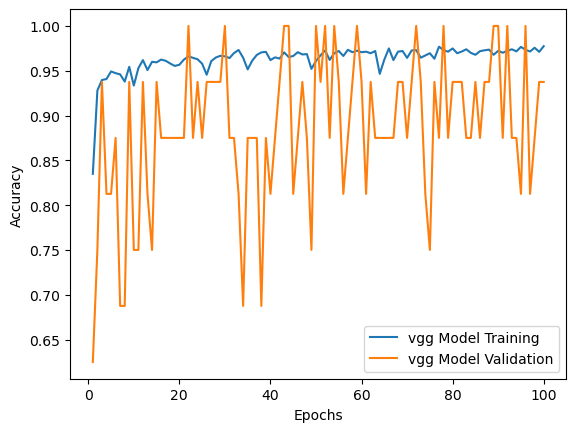

In [13]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot(x, history_vgg.history['accuracy'], label = "vgg Model Training", linestyle="-")
plt.plot(x, history_vgg.history['val_accuracy'], label = "vgg Model Validation", linestyle="-")
plt.legend()
plt.show()

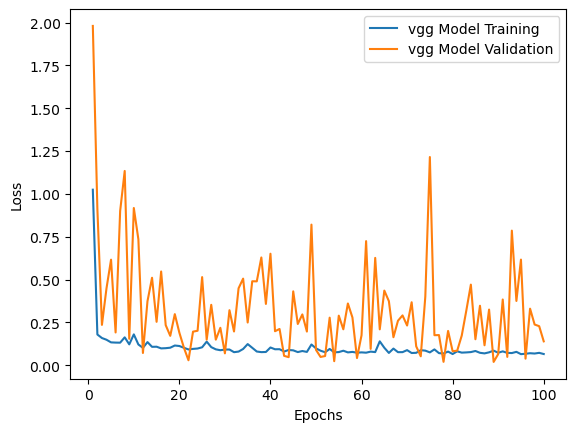

In [14]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(x, history_vgg.history['loss'], label = "vgg Model Training", linestyle="-")
plt.plot(x, history_vgg.history['val_loss'], label = "vgg Model Validation", linestyle="-")
plt.legend()
plt.show()

In [15]:
true_value = []
pred_vgg = []

for folder in os.listdir(test_folders):
    
    test_image_ids = os.listdir(os.path.join(test_folders,folder))
    
    for image_id in test_image_ids[:int(len(test_image_ids))]:
        
        path = os.path.join(test_folders,folder,image_id)
        
        true_value.append(test_generator.class_indices[folder])
        img = cv2.resize(cv2.imread(path),(299,299))
        img_normalized = img/255
        
        image_vgg_prediction = vgg.predict(np.array([img_normalized])).argmax()
        pred_vgg.append(image_vgg_prediction)
        
print(true_value)
print(pred_vgg)

1/1 [==============================] - 1s 831ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 20m

In [16]:
from sklearn.metrics import confusion_matrix
import itertools
def clf_report(true_value, model_pred):
    classes = test_generator.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)

    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass

    print(classification_report(true_value, model_pred, target_names = list(classes)))

Model Accuracy 0.9006410256410257

              precision    recall  f1-score   support



      NORMAL       0.95      0.77      0.85       234

   PNEUMONIA       0.88      0.98      0.92       390



    accuracy                           0.90       624

   macro avg       0.92      0.88      0.89       624

weighted avg       0.91      0.90      0.90       624




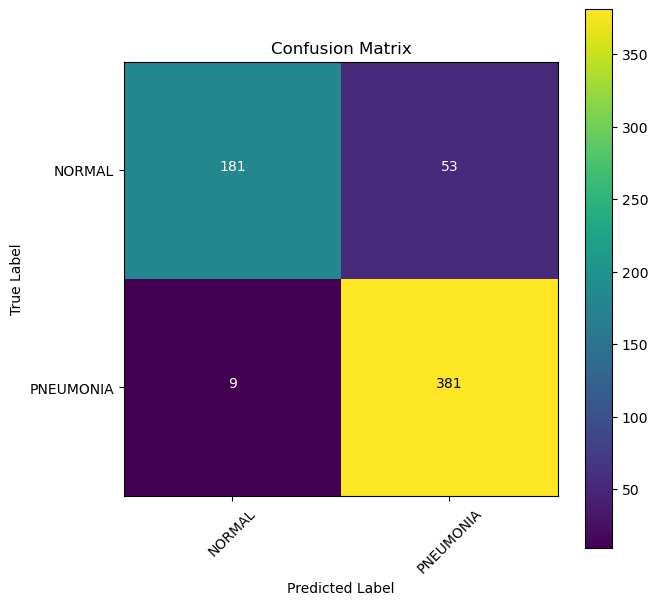

In [17]:
clf_report(true_value, pred_vgg)

In [18]:
models = [vgg]

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 29ms/step

1/1 [==============================] - 0s 24ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 20ms

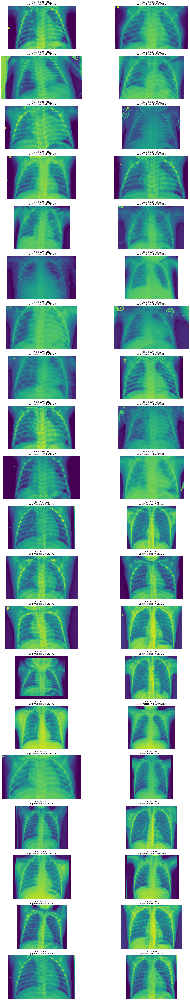

In [19]:
show_few_images(20, models)